# Notebook to evaluate inferred microbial anomaly scores

To run this notebook you need to create and activate the following conda environment:

```
conda create --name score_eval numpy pandas matplotlib seaborn scipy ipython ipykernel -y
conda activate score_eval
pip install -e .
```


## Setup

In [1]:
import os

import matplotlib.pyplot as plt
import pandas as pd

from src.utils_eval_score import (
    _plot_score_after_nth_abx_exposure,
    _plot_score_over_age,
    _select_samples_around_nth_abx_exposure,
    display_scatterplot_w_scores,
    get_scores_n_abx_info,
    plot_time_between_abx_exposures,
    plot_trajectory,
)

%load_ext autoreload
%autoreload 2
%matplotlib inline

# avg. number of days per month
DAYS_PER_MONTH = 30.437

USER input: define the inferred model and linked datasets to evaluate here:

In [2]:
#### USER INPUT START
# name of the model
model_name = "saved_models_microbial_novel_alpha_div/id-60"
# which model version to evaluate: "best" or "last"
point_to_evaluate = "best"

# name of feature dataset used for model
ft_name = "ft_vat19_anomaly_v20240806_entero_genus"
# name of abx time-series used for model
abx_ts_name = "ts_vat19_abx_v20240806"

# limit evaluation to time range up to this many months (if None no limit is set
# and all scores are evaluated)
limit_months = 24.0

# whether to group samples prior to abx exposure in analysis
group_samples = False

# how many samples prior and after abx exposure to consider
min_samples = -3.0
max_samples = 12.0

# whether to filter noabx score samples by having at least 1 obs prior to cutoff
no_filter = True
#### USER INPUT END

## Prepare data

In [3]:
scores_path = f"../data/{model_name}/anomaly_detection/scores_{point_to_evaluate}/"
evaluation_path = (
    f"../data/{model_name}/anomaly_detection/evaluation_{point_to_evaluate}_overall/"
)

if not os.path.exists(evaluation_path):
    os.makedirs(evaluation_path)


In [4]:
noabx_train, noabx_val, abx_scores_flat, abx_df, abx_age_at_all = get_scores_n_abx_info(
    scores_path, limit_months, ft_name, abx_ts_name, no_filter=no_filter
)


## Score after abx exposure 1st, 2nd and 3rd


### score_1, score_2 and score_3 respectively

(360, 18)
(195, 18)
(119, 18)


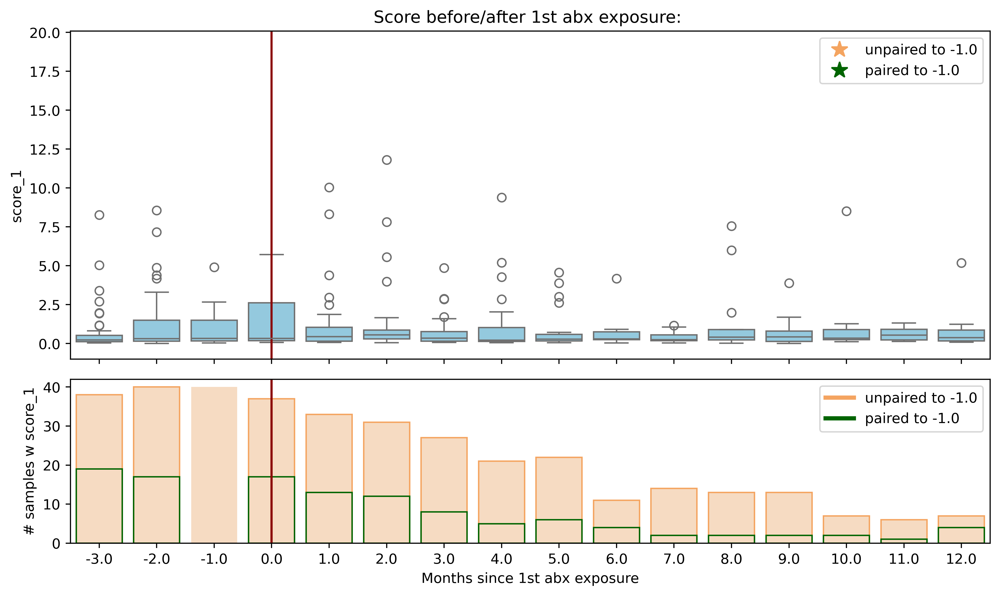

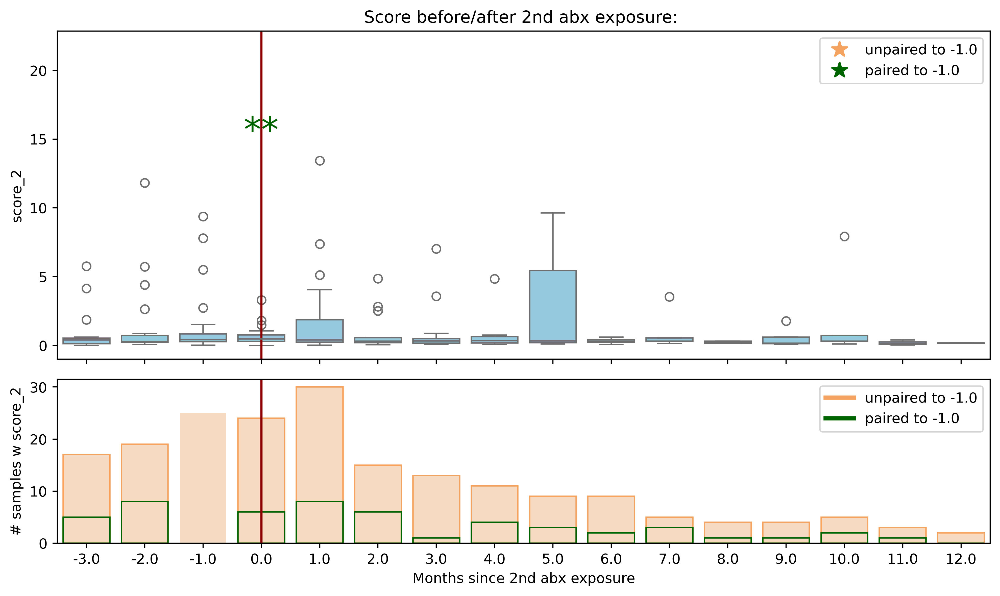

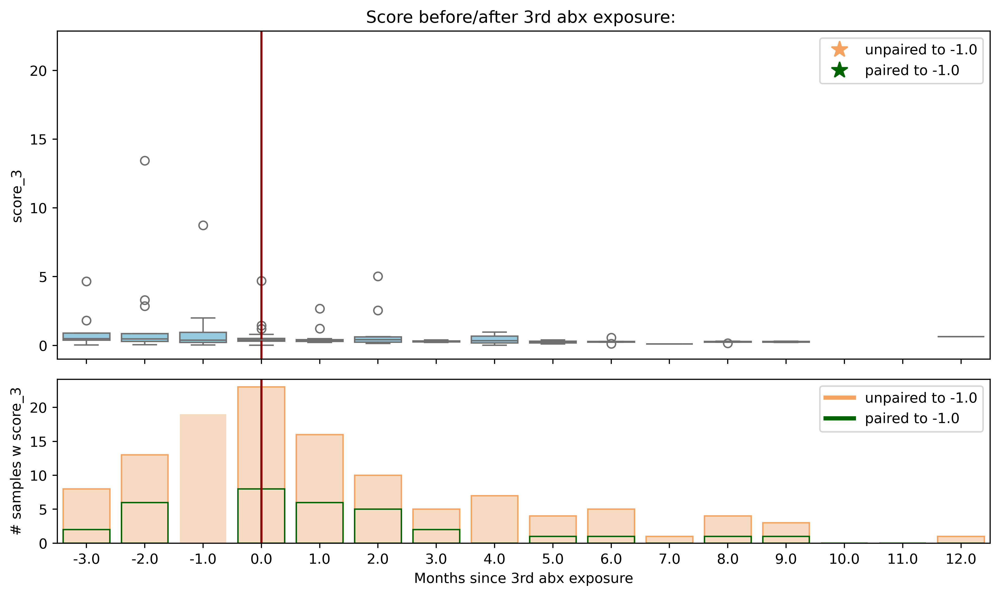

In [5]:
# get samples around n-th abx exposure
for n in [1, 2, 3]:
    score_col = f"score_{n}"
    scores_abx_nth_samples = _select_samples_around_nth_abx_exposure(
        abx_scores_flat,
        abx_df,
        n=n,
        min_samples=min_samples,
        max_samples=max_samples,
        group_samples=group_samples,
        score_var=score_col,
    )
    print(scores_abx_nth_samples.shape)
    _plot_score_after_nth_abx_exposure(
        scores_abx_nth_samples,
        x_axis="diff_age_nth_abx",
        y_axis=score_col,
        n=n,
        path_to_save=evaluation_path,
        flag=score_col,
        min_samples=min_samples,
        max_samples=max_samples,
        grouped_samples=group_samples,
    )

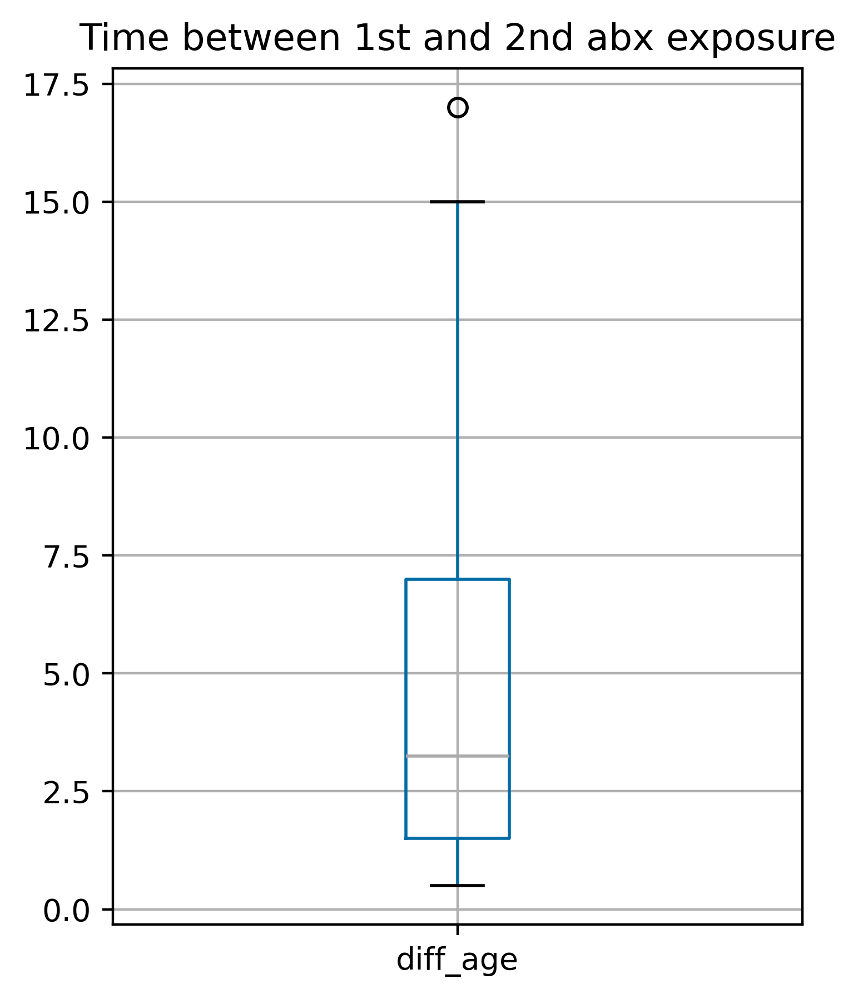

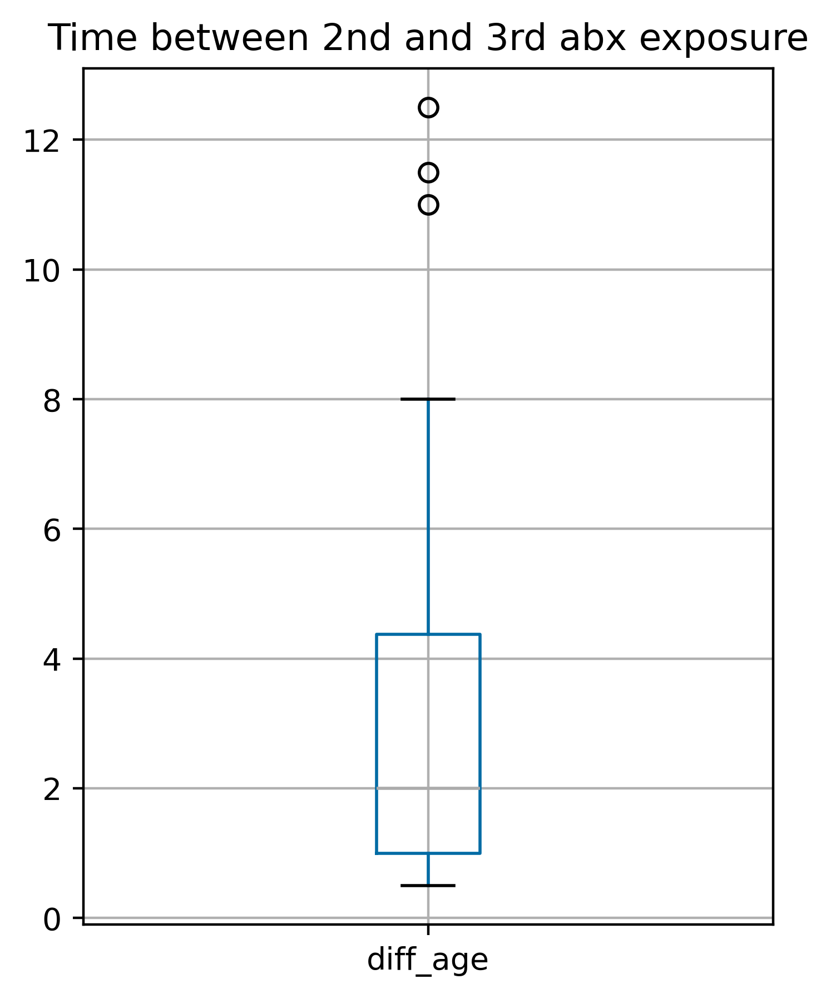

In [6]:
plot_time_between_abx_exposures(
    abx_age_at_all, n0_label="1st", n1_label="2nd", path_to_save=evaluation_path
)
plt.show()
plot_time_between_abx_exposures(
    abx_age_at_all, n0_label="2nd", n1_label="3rd", path_to_save=evaluation_path
)
plt.show()

### score_1 only - for comparison with alpha diversity matching

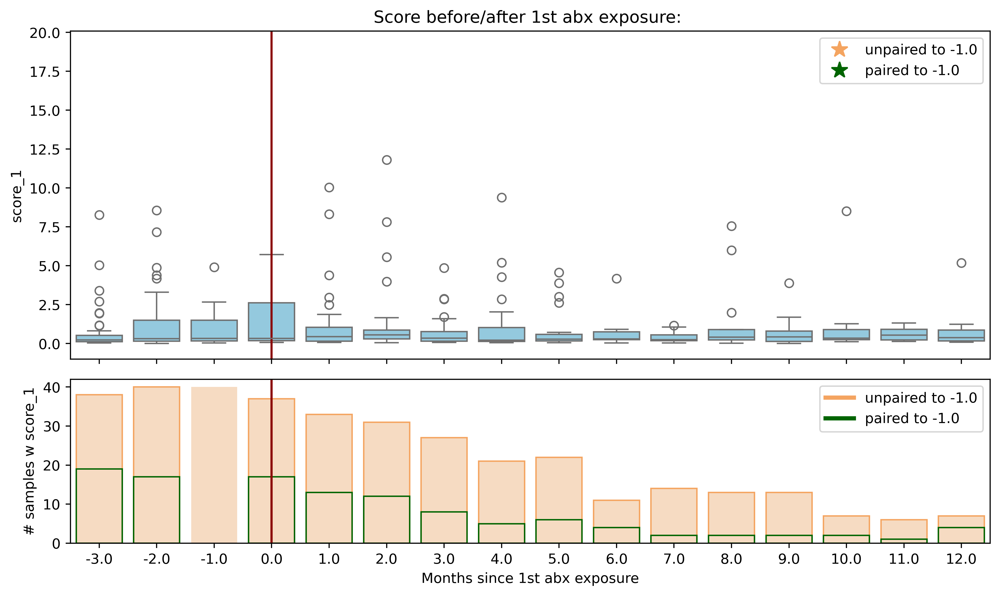

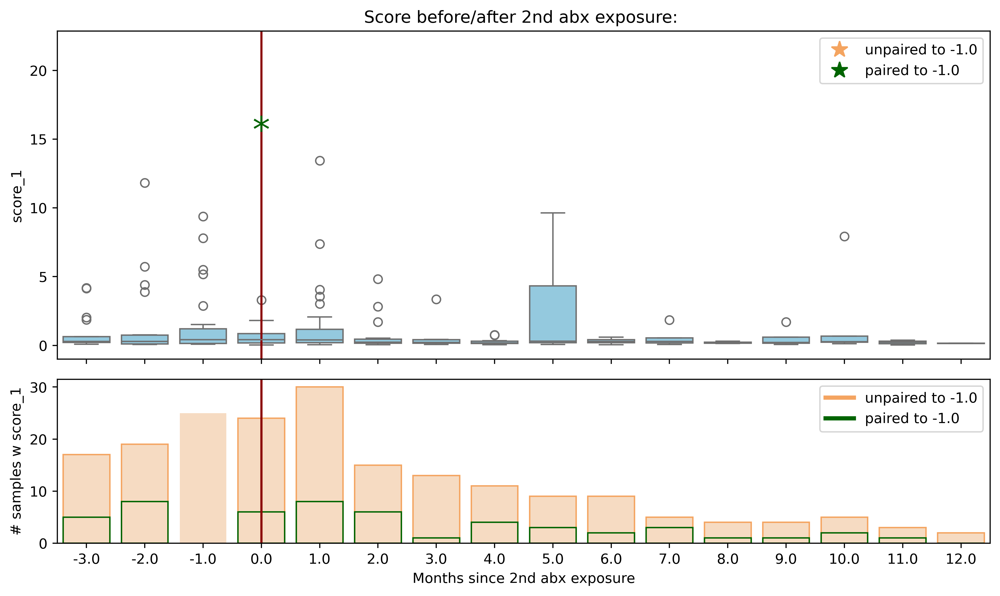

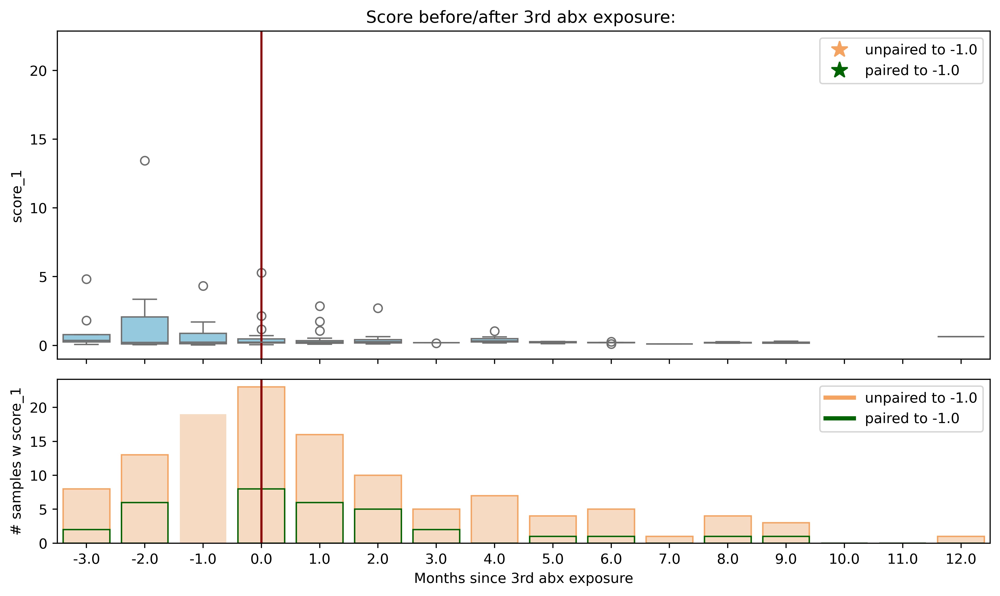

In [7]:
# get samples around n-th abx exposure
for n in [1, 2, 3]:
    score_col = "score_1"
    scores_abx_nth_samples = _select_samples_around_nth_abx_exposure(
        abx_scores_flat,
        abx_df,
        n=n,
        min_samples=min_samples,
        max_samples=max_samples,
        group_samples=group_samples,
        score_var=score_col,
    )
    _plot_score_after_nth_abx_exposure(
        scores_abx_nth_samples,
        x_axis="diff_age_nth_abx",
        y_axis=score_col,
        n=n,
        path_to_save=evaluation_path,
        flag="score_1_only",
        min_samples=min_samples,
        max_samples=max_samples,
        grouped_samples=group_samples,
    )

## Score after 2nd abx: split by time since 1st abx exposure

In [8]:
duration_threshold = 5  # in months

In [9]:
abx_time_between = abx_age_at_all.copy()
abx_time_between["time_since_1st"] = (
    abx_time_between["age_2nd_abx"] - abx_time_between["age_1st_abx"]
)

bins = [-float("inf"), duration_threshold, float("inf")]
between_labels = [f"<= {duration_threshold} months", f"> {duration_threshold} months"]
abx_time_between["time_since_1st_cat"] = pd.cut(
    abx_time_between["time_since_1st"],
    bins=bins,
    labels=between_labels,
    right=True,
)
abx_time_between.reset_index(inplace=True)

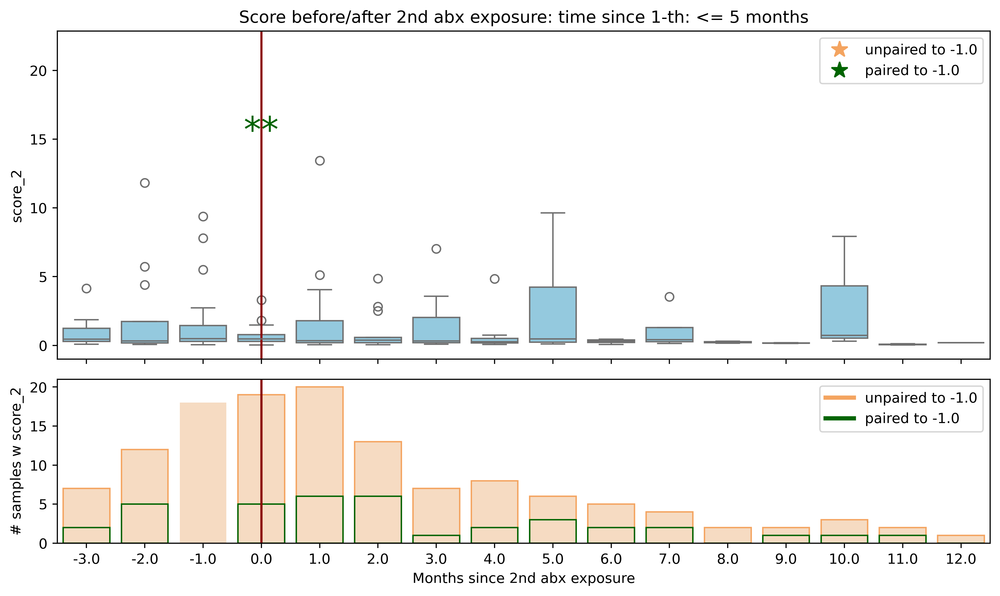

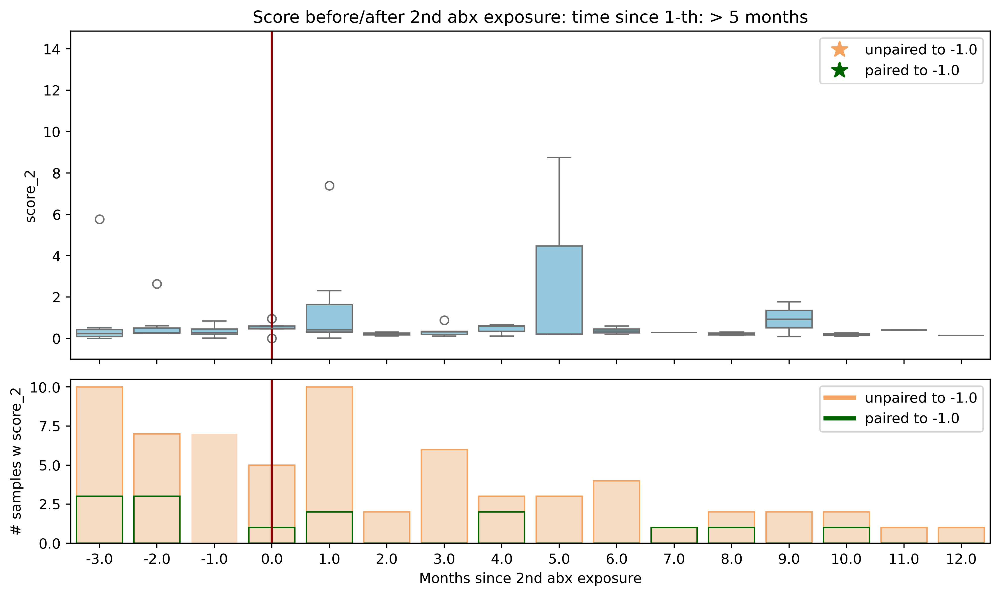

In [10]:
# get samples around n-th abx exposure
n = 2
i = 0
score_col = f"score_{n}"
scores_abx_nth_samples = _select_samples_around_nth_abx_exposure(
    abx_scores_flat,
    abx_df,
    n=n,
    min_samples=min_samples,
    max_samples=max_samples,
    group_samples=group_samples,
    score_var=score_col,
)

for cat in between_labels:
    # filter only for scores of hosts where 2nd abx is in cat time duration
    hosts = abx_time_between[abx_time_between["time_since_1st_cat"] == cat][
        "host_id"
    ].unique()

    scores_abx_nth_samples_f = scores_abx_nth_samples[
        scores_abx_nth_samples["host_id"].isin(hosts)
    ].copy()
    flag = f"time_since_{n-1}th_{i}"
    _plot_score_after_nth_abx_exposure(
        scores_abx_nth_samples_f,
        x_axis="diff_age_nth_abx",
        y_axis=score_col,
        n=n,
        path_to_save=evaluation_path,
        flag=flag,
        tag=f"time since {n-1}-th: {cat}",
        min_samples=min_samples,
        max_samples=max_samples,
        grouped_samples=group_samples,
    )
    i += 1

## Score after 1st abx: split by duration:

abx_duration_category
>= 6 days    145
NaN          130
< 6 days      85
Name: count, dtype: int64

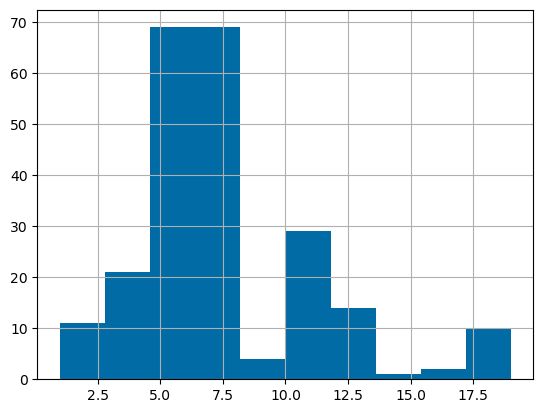

In [11]:
n = 1
score_col = f"score_{n}"
scores_abx_nth_samples = _select_samples_around_nth_abx_exposure(
    abx_scores_flat,
    abx_df,
    n=n,
    min_samples=min_samples,
    max_samples=max_samples,
    group_samples=group_samples,
    score_var=score_col,
)

# bin duration into short, mid and long duration
scores_abx_nth_samples["abx_any_last_dur_days"].hist(bins=10)

bins = [-float("inf"), 6, float("inf")]
dur_labels = ["< 6 days", ">= 6 days"]
scores_abx_nth_samples["abx_duration_category"] = pd.cut(
    scores_abx_nth_samples["abx_any_last_dur_days"],
    bins=bins,
    labels=dur_labels,
    right=False,
)

scores_abx_nth_samples["abx_duration_category"].value_counts(dropna=False)

< 6 days
>= 6 days


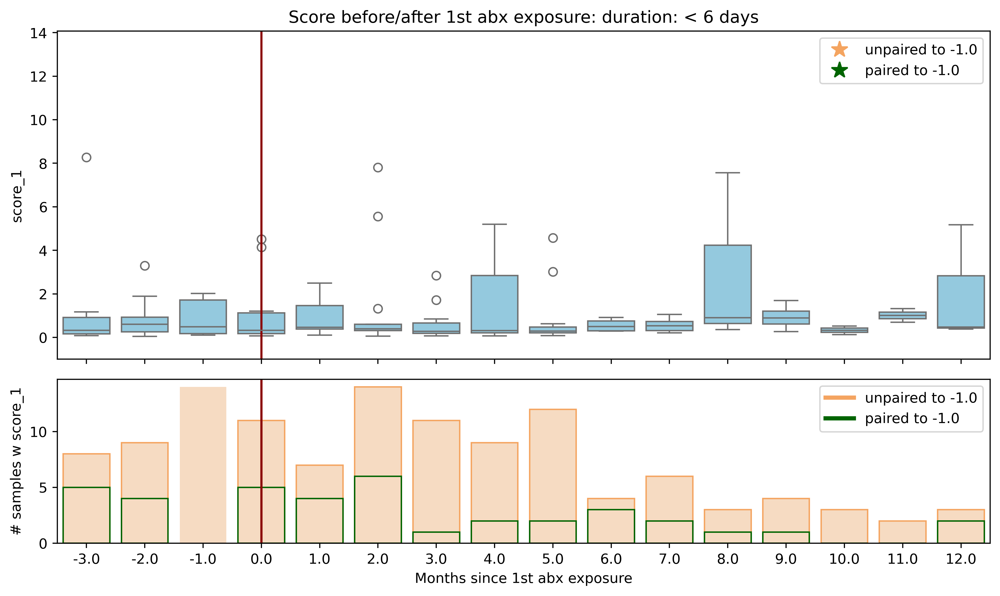

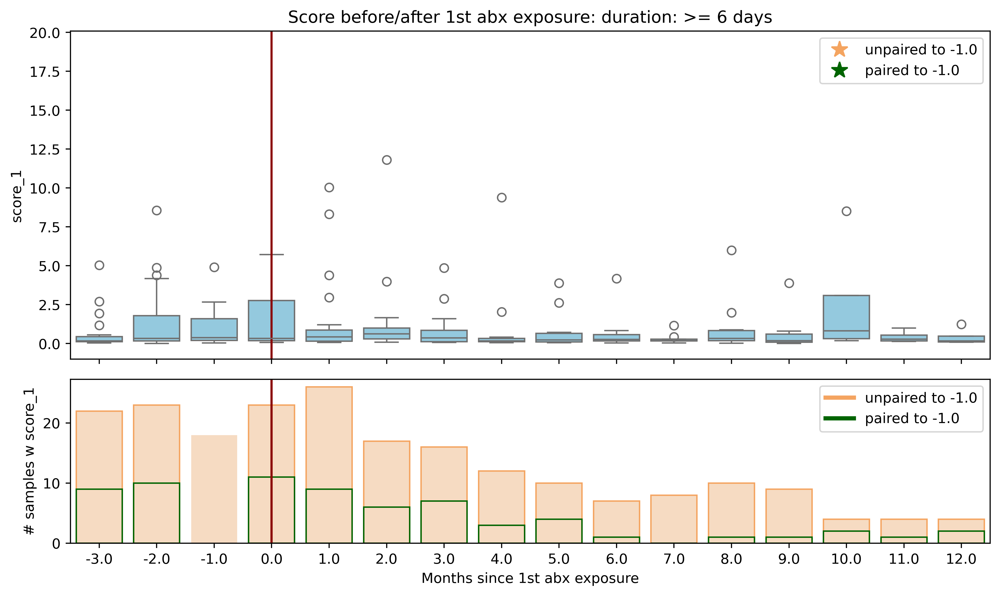

In [12]:
i = 0
for dur in dur_labels:
    print(dur)
    # evaluation_path_bin = f"{evaluation_path}duration_bins{i}/"
    host_w_dur = (
        scores_abx_nth_samples.loc[
            scores_abx_nth_samples["abx_duration_category"] == dur, "host_id"
        ]
        .unique()
        .tolist()
    )
    scores_abx_nth_samples_dur = scores_abx_nth_samples.loc[
        scores_abx_nth_samples["host_id"].isin(host_w_dur)
    ].copy()
    flag_dur = f"dur_{i}"
    _plot_score_after_nth_abx_exposure(
        scores_abx_nth_samples_dur,
        x_axis="diff_age_nth_abx",
        y_axis=score_col,
        n=n,
        path_to_save=evaluation_path,
        flag=flag_dur,
        tag=f"duration: {dur}",
        min_samples=min_samples,
        max_samples=max_samples,
        grouped_samples=group_samples,
    )

    i += 1

## Score after 1st abx: split by time of life

age_nth_abx_category
6 - 12 months     133
12 - 18 months    105
<= 6 months        87
18 - 24 months     35
Name: count, dtype: int64
<= 6 months
6 - 12 months
12 - 18 months
18 - 24 months


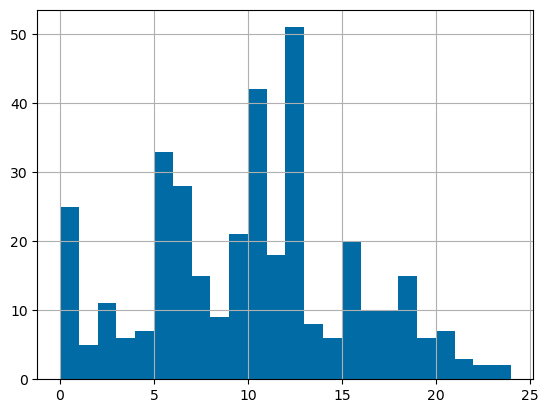

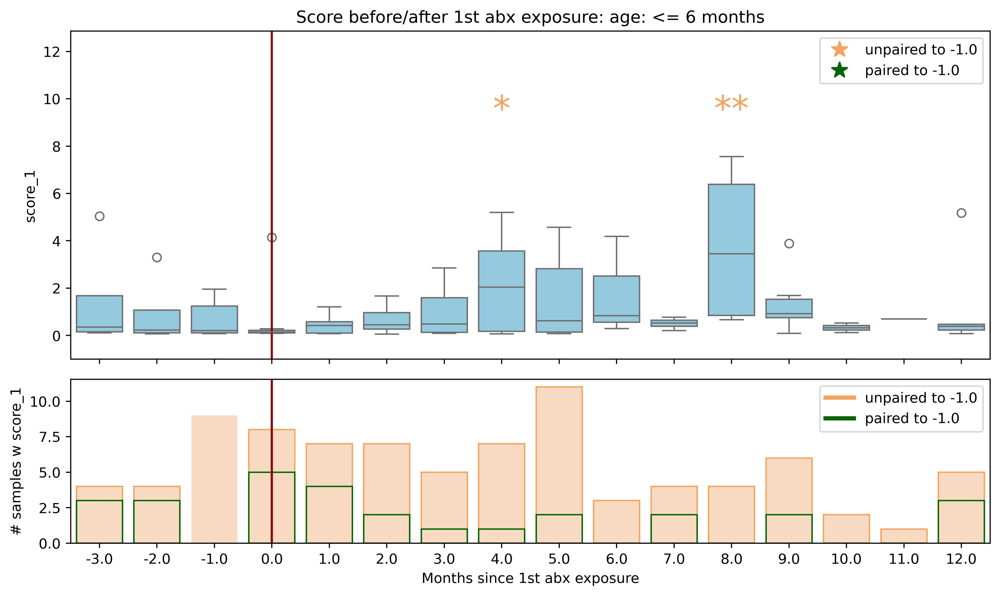

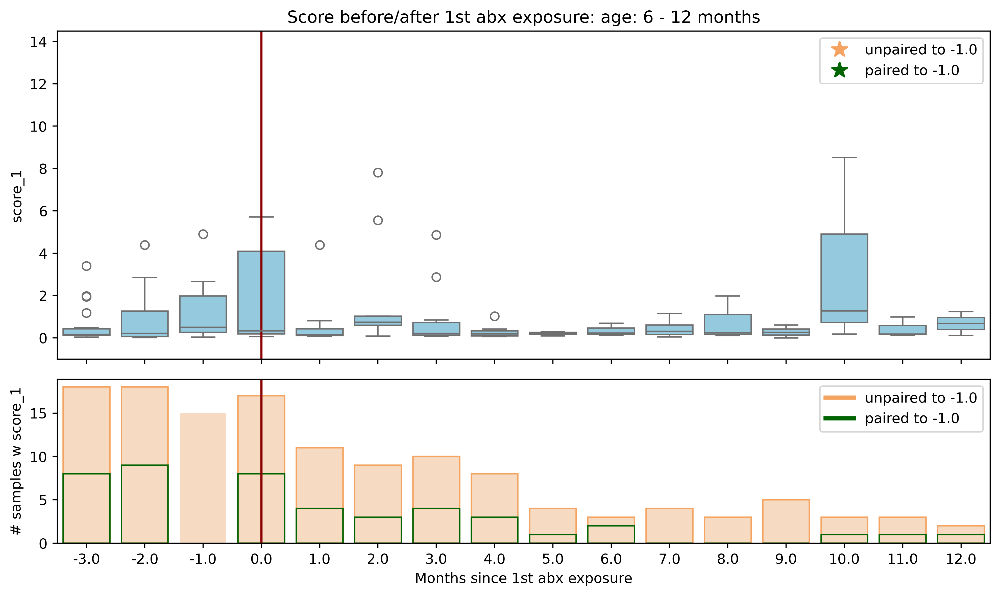

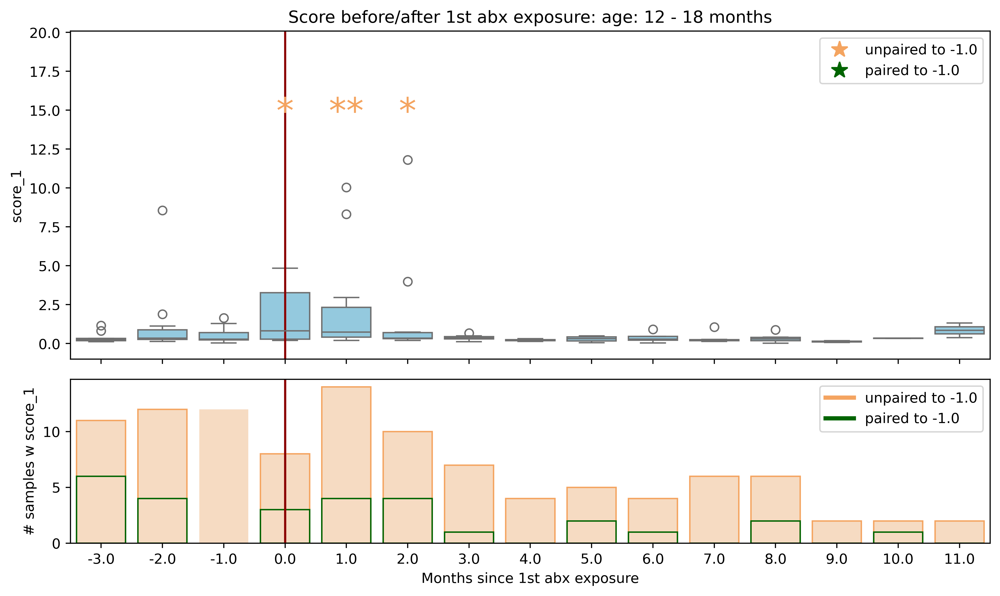

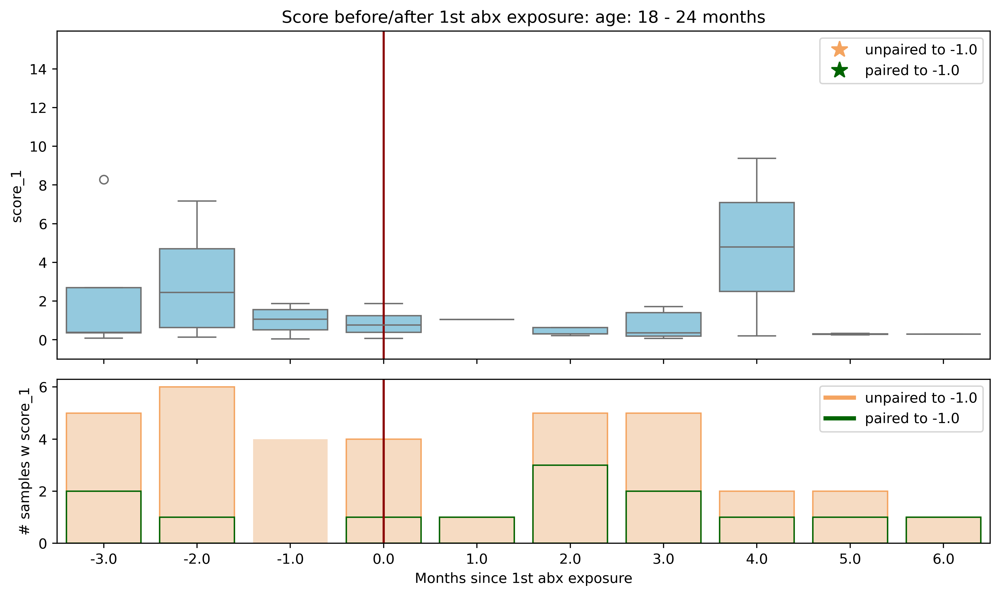

In [13]:
n = 1
score_col = f"score_{n}"
scores_abx_nth_samples = _select_samples_around_nth_abx_exposure(
    abx_scores_flat,
    abx_df,
    n=n,
    min_samples=min_samples,
    max_samples=max_samples,
    group_samples=group_samples,
    score_var=score_col,
)

# bin duration into short, mid and long duration
scores_abx_nth_samples["age_nth_abx"].hist(bins=24)

bins_age = [-float("inf"), 6, 12, 18, float("inf")]
# <6: pre weaning
age_labels = ["<= 6 months", "6 - 12 months", "12 - 18 months", "18 - 24 months"]
scores_abx_nth_samples["age_nth_abx_category"] = pd.cut(
    scores_abx_nth_samples["age_nth_abx"], bins=bins_age, labels=age_labels, right=False
)

print(scores_abx_nth_samples["age_nth_abx_category"].value_counts(dropna=False))

i = 0
for a in age_labels:
    print(a)
    # evaluation_path_bin = f"{evaluation_path}age_bins{i}/"

    # age at time of abx exposure should match a
    scores_abx_nth_samples_age = scores_abx_nth_samples.loc[
        scores_abx_nth_samples["age_nth_abx_category"] == a
    ].copy()
    flag_age = f"age_{i}"
    _plot_score_after_nth_abx_exposure(
        scores_abx_nth_samples_age,
        x_axis="diff_age_nth_abx",
        y_axis=score_col,
        n=n,
        path_to_save=evaluation_path,
        flag=flag_age,
        tag=f"age: {a}",
        min_samples=min_samples,
        max_samples=max_samples,
        grouped_samples=group_samples,
    )

    i += 1

## Score after 1st abx: split by type of abx (top 1 vs. others)

In [14]:
n = 1
score_col = f"score_{n}"
scores_abx_nth_samples = _select_samples_around_nth_abx_exposure(
    abx_scores_flat,
    abx_df,
    n=n,
    min_samples=min_samples,
    max_samples=max_samples,
    group_samples=group_samples,
    score_var=score_col,
)

# add top 1 vs. others
scores_abx_nth_samples["abx_type_cat"] = scores_abx_nth_samples["abx_type"].apply(
    lambda x: "Penicillin" if x == "Penicillin" else "Others"
)
scores_abx_nth_samples["abx_type_cat"].value_counts(dropna=False)

abx_type_cat
Penicillin    212
Others        148
Name: count, dtype: int64

In [15]:
# select types to look for
abx_types = scores_abx_nth_samples["abx_type_cat"].unique().tolist()
# abx_types = ["Penicillin", "Cephalosporine", "Cotrimoxazole", "Macrolide"]
abx_types

['Others', 'Penicillin']

Others
Penicillin


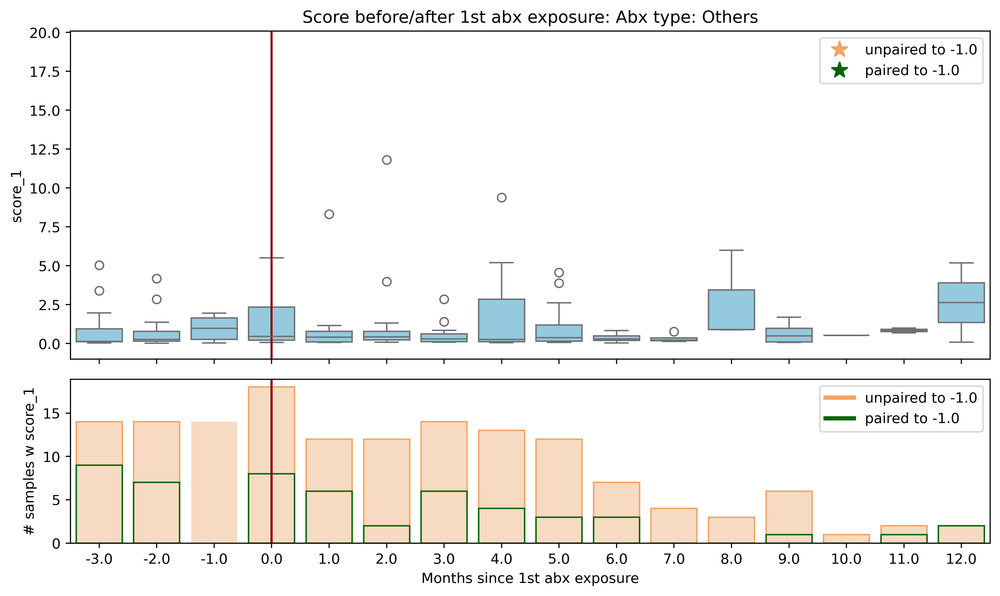

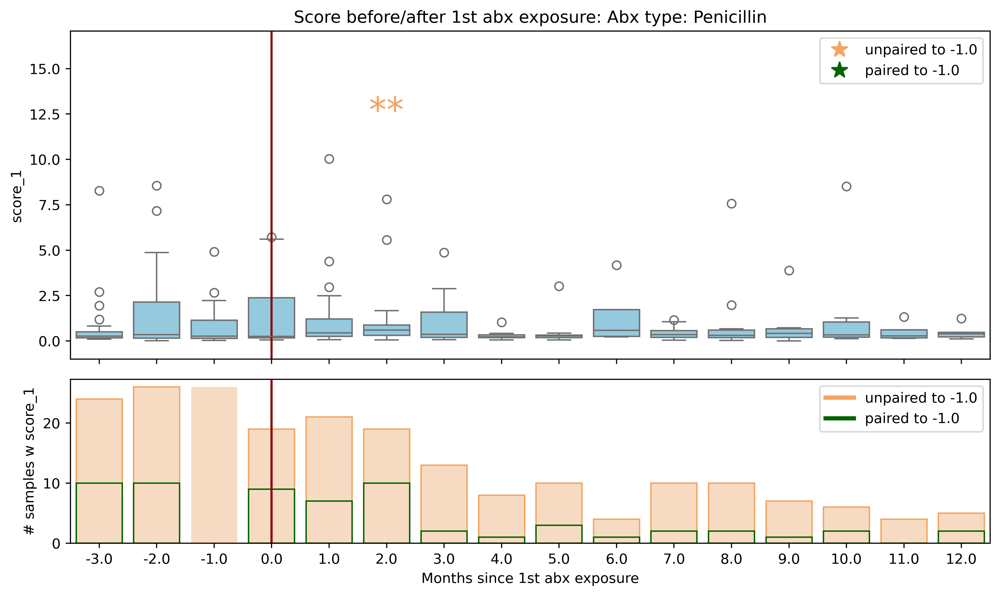

In [16]:
abx_col = "abx_type_cat"
# abx_col = "abx_type"
for abx in abx_types:
    print(abx)
    abx_str = abx.lower().replace(" ", "_").replace(",", "_")
    flag_abx = f"abx_type_{abx_str}"
    # evaluation_path_abx = f"{evaluation_path}abx_type_{abx_str}/"

    # age at time of abx exposure should match a
    scores_abx_nth_samples_abx = scores_abx_nth_samples.loc[
        scores_abx_nth_samples[abx_col].str.contains(abx)
    ].copy()

    _plot_score_after_nth_abx_exposure(
        scores_abx_nth_samples_abx,
        x_axis="diff_age_nth_abx",
        y_axis=score_col,
        n=n,
        path_to_save=evaluation_path,
        flag=flag_abx,
        tag=f"Abx type: {abx}",
        min_samples=min_samples,
        max_samples=max_samples,
        grouped_samples=group_samples,
    )

    i += 1

## Score after 1st abx: split by type of abx reason (top 1 vs. others)

In [17]:
n = 1
score_col = f"score_{n}"
scores_abx_nth_samples = _select_samples_around_nth_abx_exposure(
    abx_scores_flat,
    abx_df,
    n=n,
    min_samples=min_samples,
    max_samples=max_samples,
    group_samples=group_samples,
    score_var=score_col,
)
# top 1 vs. others
print(scores_abx_nth_samples["abx_reason"].value_counts(dropna=False))

scores_abx_nth_samples["abx_reason_cat"] = scores_abx_nth_samples["abx_reason"].apply(
    lambda x: "Otitis media" if x == "Otitis media" else "Others"
)
print(scores_abx_nth_samples["abx_reason_cat"].value_counts(dropna=False))

reasons = scores_abx_nth_samples["abx_reason_cat"].unique().tolist()


abx_reason
Otitis media                                    205
Infection of respiratory tract                   66
Others                                           43
Gastroenteritis                                  25
Infection of urinary tract                       11
Prophylaxis                                       6
Infection of respiratory tract, Otitis media      2
Infection in neonatal period                      2
Name: count, dtype: int64
abx_reason_cat
Otitis media    205
Others          155
Name: count, dtype: int64


In [18]:
# # top 4 reasons
# reasons = (
#     scores_abx_nth_samples["abx_reason"]
#     .value_counts(dropna=False)
#     .iloc[:4]
#     .index.tolist()
# )
# reasons

Otitis media
Others


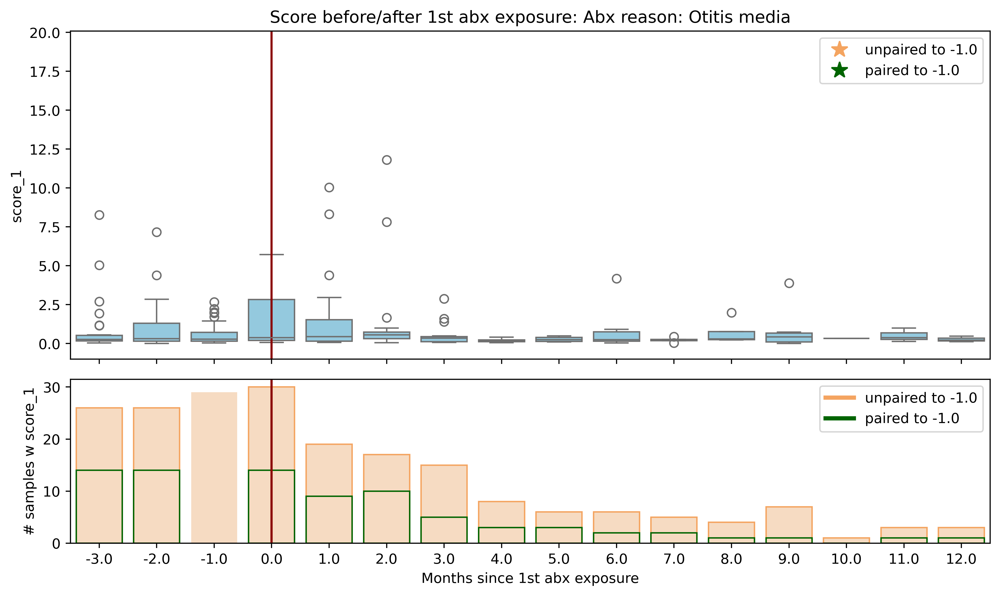

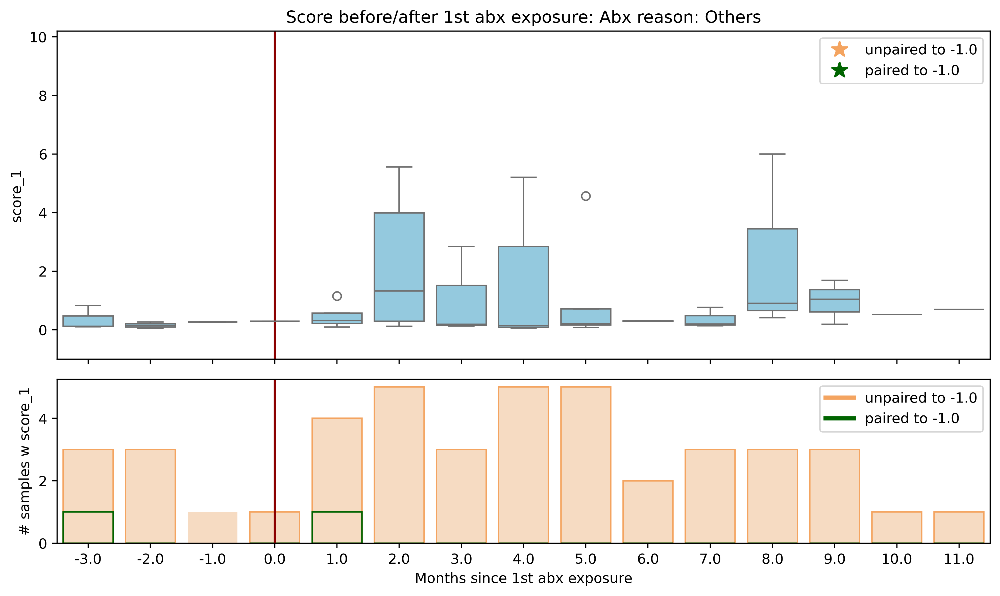

In [19]:
for r in reasons:
    print(r)
    r_str = r.lower().replace(" ", "_").replace(",", "_")
    # evaluation_path_r = f"{evaluation_path}abx_reason_{r_str}/"

    # age at time of abx exposure should match a
    scores_abx_nth_samples_r = scores_abx_nth_samples.loc[
        scores_abx_nth_samples["abx_reason"] == r
    ].copy()
    flag_reason = f"abx_reason_{r_str}"
    _plot_score_after_nth_abx_exposure(
        scores_abx_nth_samples_r,
        x_axis="diff_age_nth_abx",
        y_axis=score_col,
        n=n,
        path_to_save=evaluation_path,
        flag=flag_reason,
        tag=f"Abx reason: {r}",
        min_samples=min_samples,
        max_samples=max_samples,
        grouped_samples=group_samples,
    )

    i += 1

## Score over age range

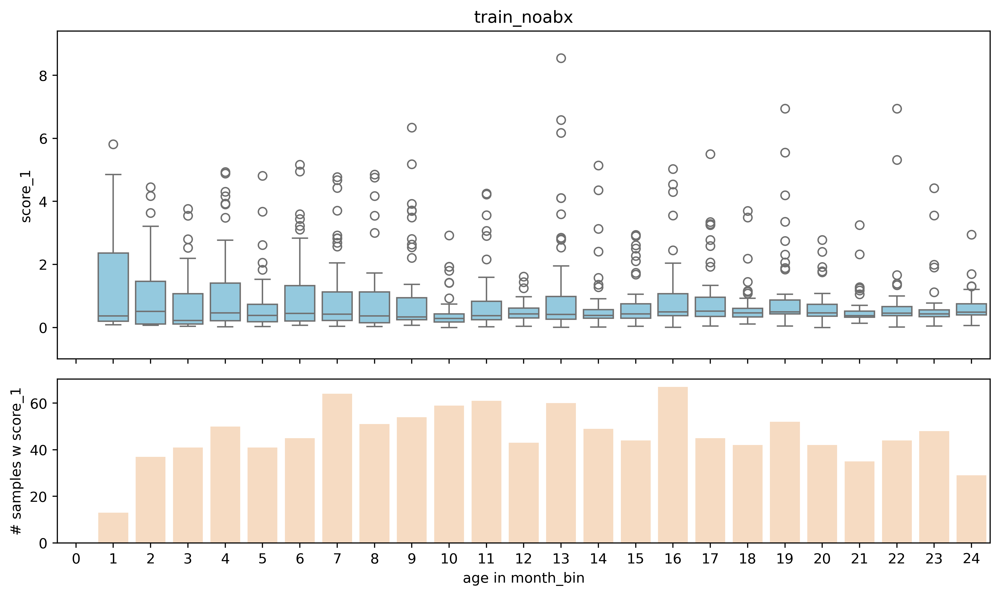

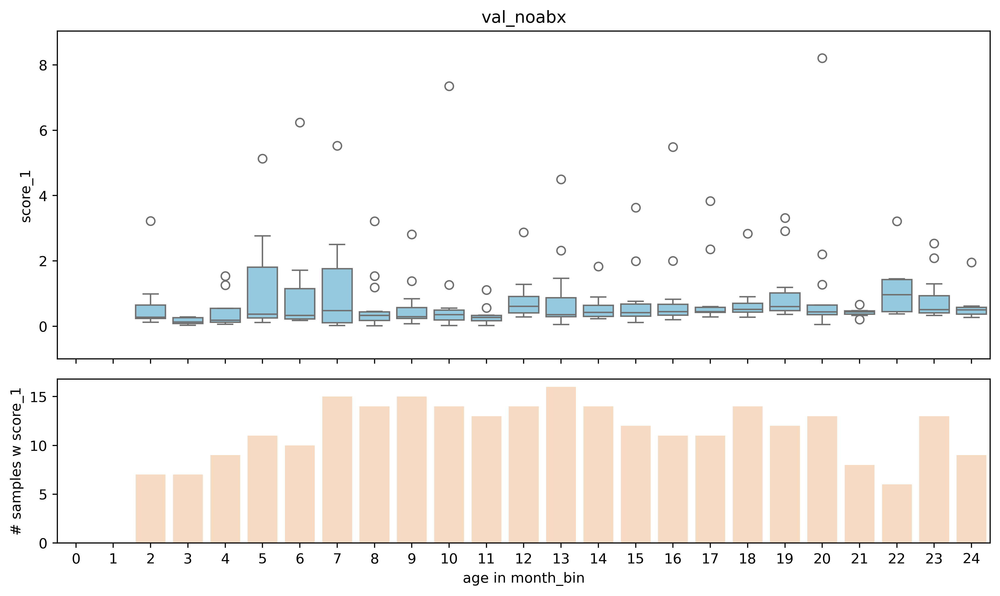

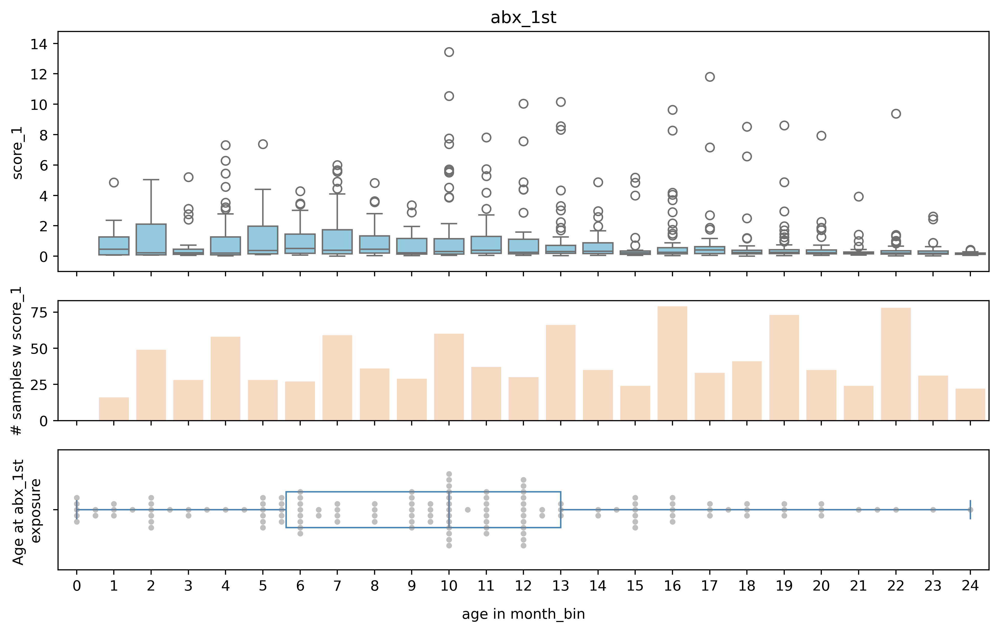

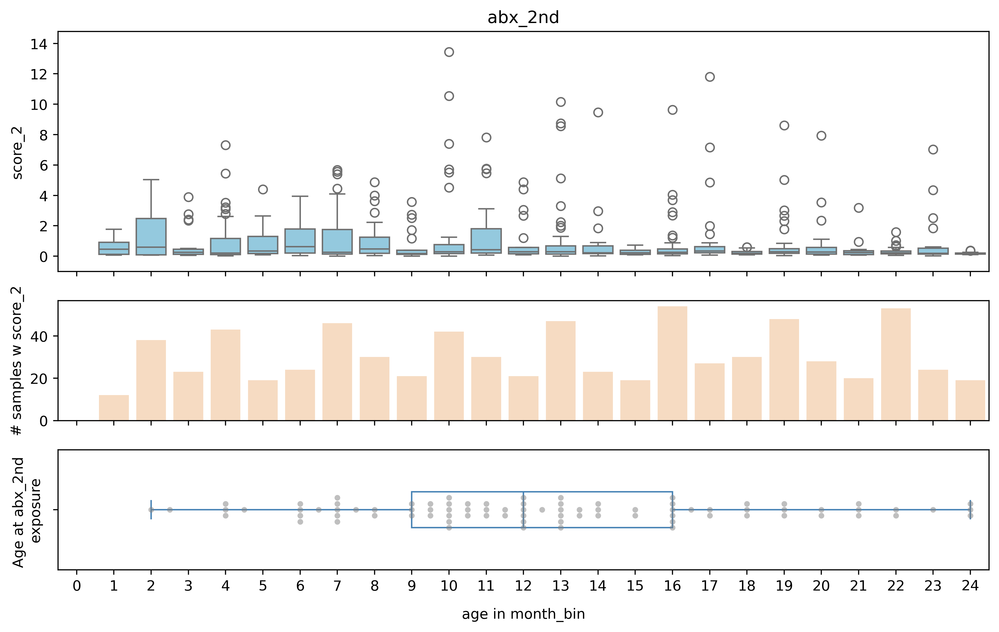

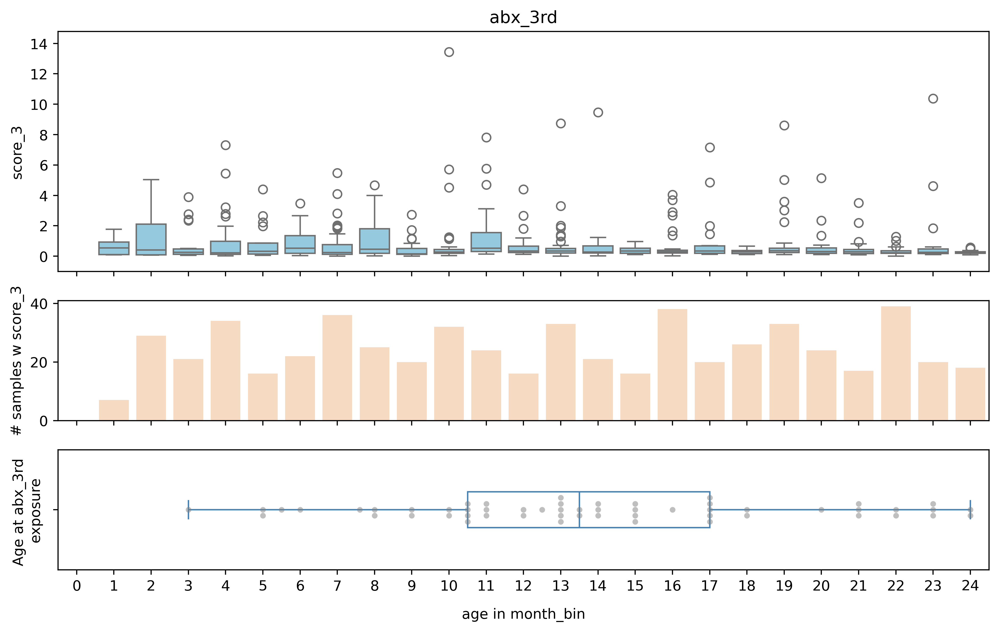

In [20]:
dic_splits_n_scores = {
    "train_noabx": ["score_1", noabx_train, None],
    "val_noabx": ["score_1", noabx_val, None],
    "abx_1st": ["score_1", abx_scores_flat, abx_age_at_all["age_1st_abx"]],
    "abx_2nd": ["score_2", abx_scores_flat, abx_age_at_all["age_2nd_abx"]],
    "abx_3rd": ["score_3", abx_scores_flat, abx_age_at_all["age_3rd_abx"]],
}

for name, v in dic_splits_n_scores.items():
    score_col = v[0]
    scores = v[1]
    abx_age_values = v[2]
    _plot_score_over_age(scores, score_col, name, evaluation_path, abx_age_values)
    plt.show()

## Score overall - scatter

In [21]:
# sort both abx dataframes by increasing abx exposure in same way
abx_scores_flat.sort_values(
    [
        "abx_max_count_ever",
        "max_abx_w_microbiome",
        "host_id",
        "day",
    ],
    ascending=[True, True, True, True],
    inplace=True,
)

# sort abx_df accordingly
# sort abx_df in same order and remove samples that don't exist in md_df
abx_events = pd.DataFrame()
abx_events["host_id"] = abx_scores_flat["host_id"].unique()
abx_events = pd.merge(abx_events, abx_df, on="host_id", how="left")

assert abx_events.host_id.unique().tolist() == abx_scores_flat.host_id.unique().tolist()


/Users/adamova/Documents/projects/14_LM1/NJODE/Probabilistic_forecasting_for_Anomaly_Detection/src/utils_eval_score.py:673: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


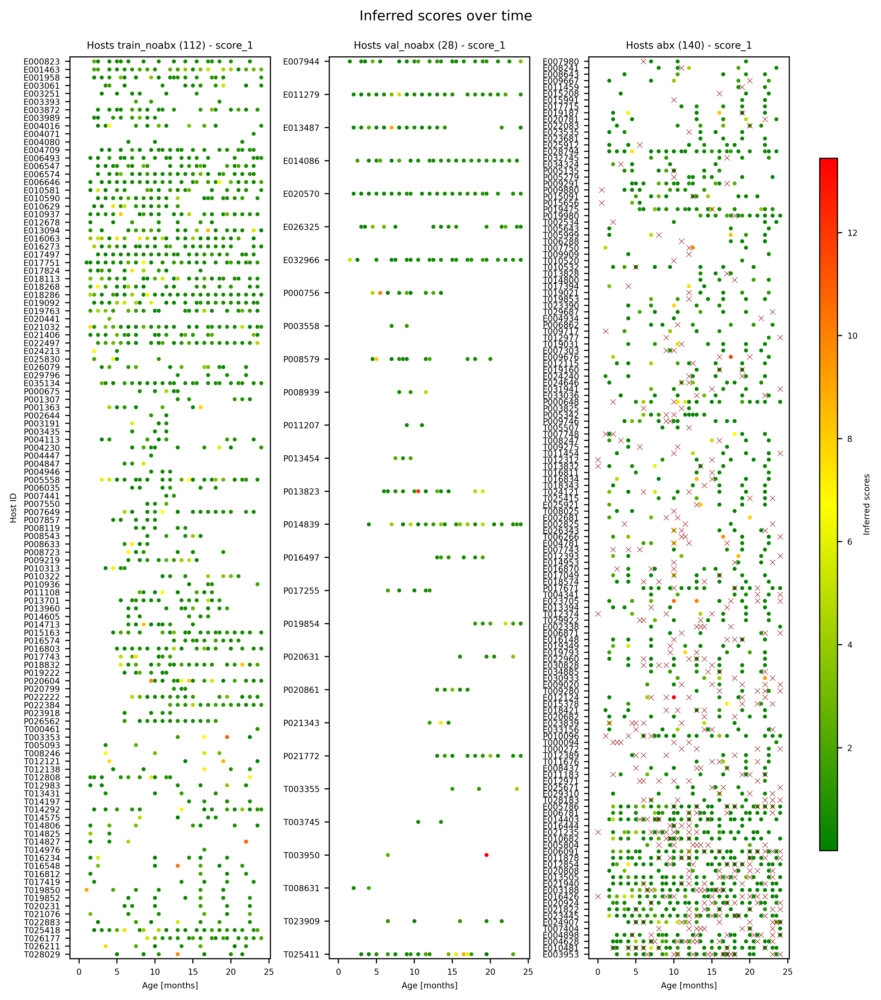

In [22]:
dic_splits = {
    "train_noabx": ["score_1", noabx_train, None],
    "val_noabx": ["score_1", noabx_val, None],
    "abx": ["score_1", abx_scores_flat, abx_events],
}

display_scatterplot_w_scores(
    dic_splits, False, path_to_output=evaluation_path, flag="noabx_vs_abx"
)

/Users/adamova/Documents/projects/14_LM1/NJODE/Probabilistic_forecasting_for_Anomaly_Detection/src/utils_eval_score.py:673: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


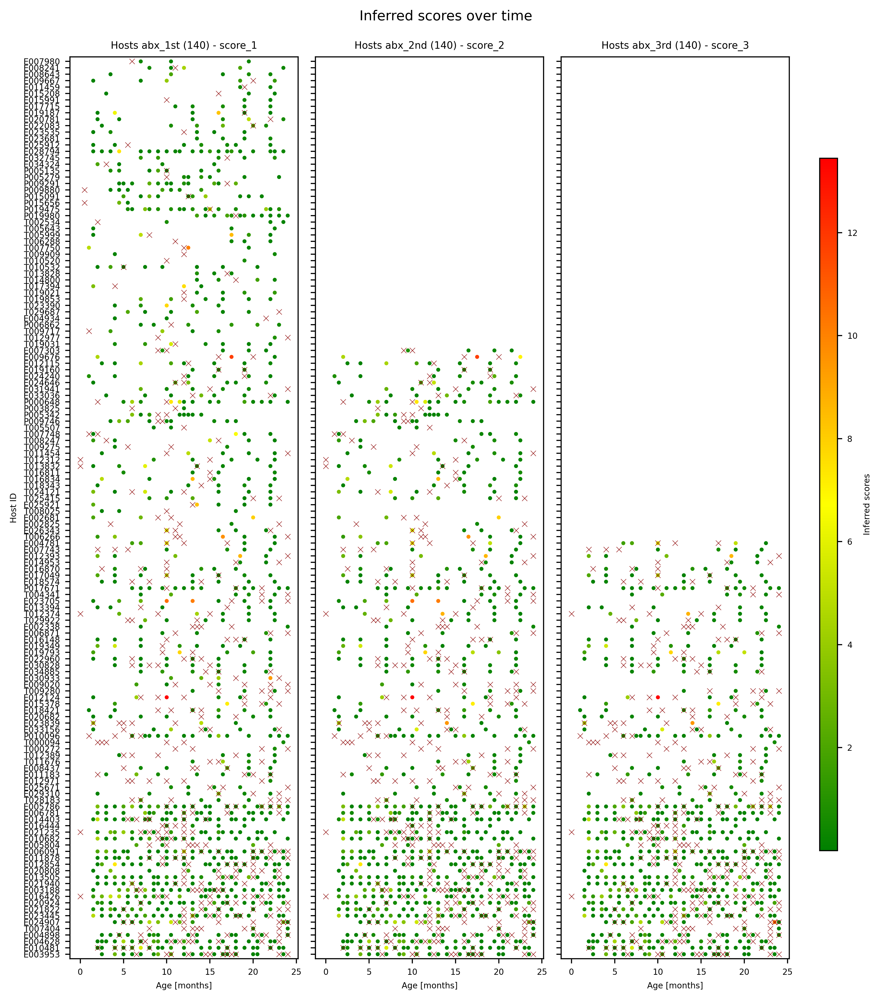

In [23]:
dic_splits = {
    "abx_1st": ["score_1", abx_scores_flat, abx_events],
    "abx_2nd": ["score_2", abx_scores_flat, abx_events],
    "abx_3rd": ["score_3", abx_scores_flat, abx_events],
}

display_scatterplot_w_scores(
    dic_splits, False, True, path_to_output=evaluation_path, flag="all_abx"
)

## Individual trajectories: score

### abx

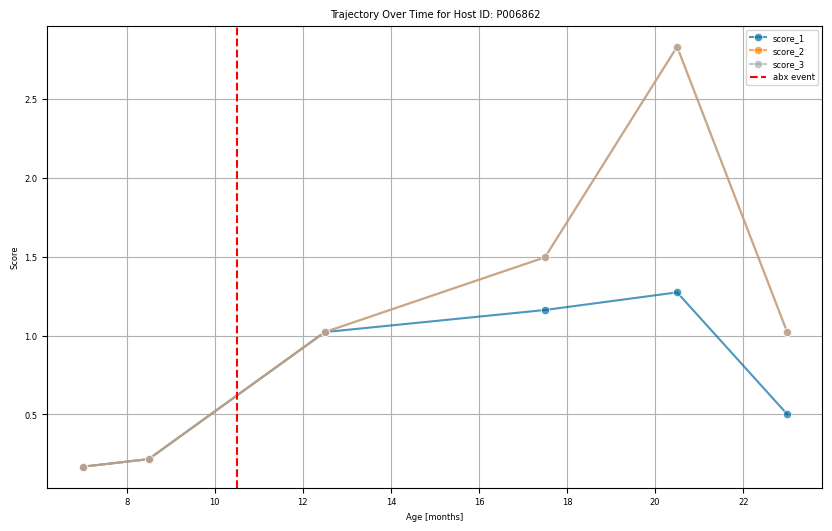

In [24]:
plot_trajectory(
    abx_scores_flat,
    abx_events,
    "P006862",
    ["score_1", "score_2", "score_3"],
    path_to_output=evaluation_path,
    flag="all_scores",
)

In [25]:
abx_scores_flat.loc[abx_scores_flat.host_id == "E024646", "abx_any_cumcount"].describe()

count    6.00000
mean     1.50000
std      0.83666
min      0.00000
25%      1.25000
50%      2.00000
75%      2.00000
max      2.00000
Name: abx_any_cumcount, dtype: float64

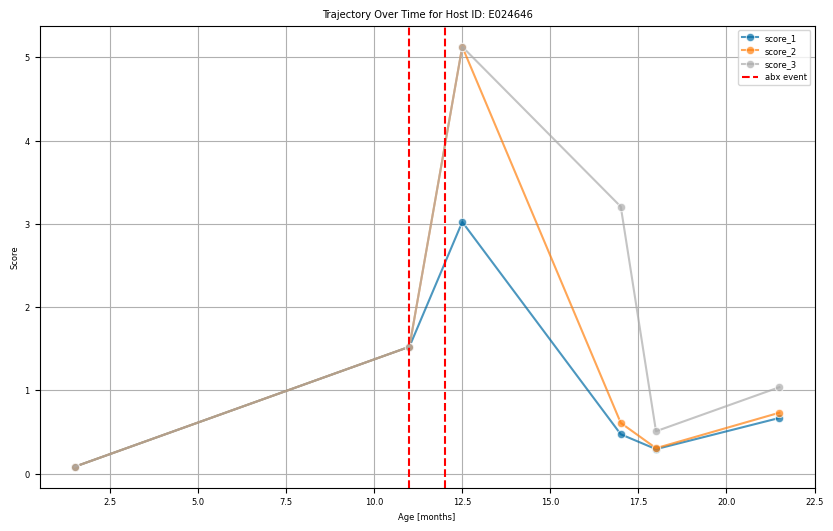

In [26]:
plot_trajectory(
    abx_scores_flat,
    abx_events,
    "E024646",
    ["score_1", "score_2", "score_3"],
    path_to_output=evaluation_path,
    flag="all_scores",
)

In [27]:
abx_scores_flat.loc[abx_scores_flat.host_id == "E009676", "abx_any_cumcount"].describe()

count    3.0
mean     1.0
std      1.0
min      0.0
25%      0.5
50%      1.0
75%      1.5
max      2.0
Name: abx_any_cumcount, dtype: float64

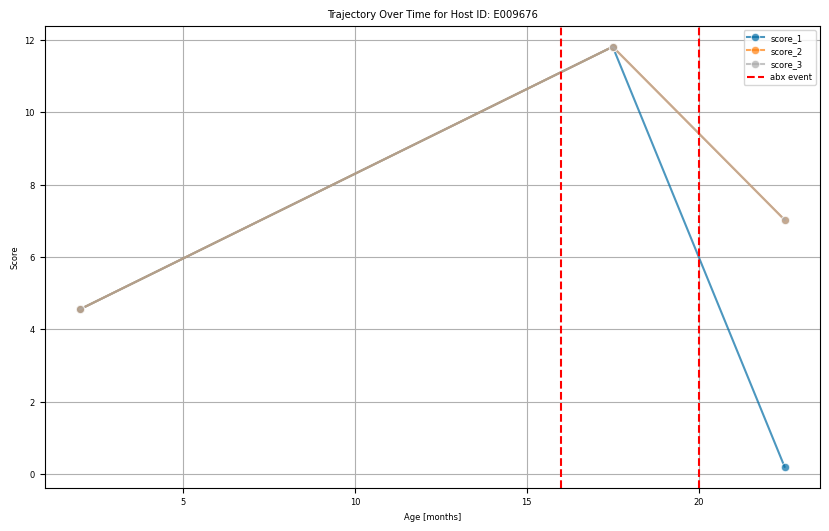

In [28]:
plot_trajectory(
    abx_scores_flat,
    abx_events,
    "E009676",
    ["score_1", "score_2", "score_3"],
    path_to_output=evaluation_path,
    flag="all_scores",
)

In [29]:
abx_scores_flat.loc[abx_scores_flat.host_id == "E004898", :]

,host_id,abx,day,score_1,score_2,score_3,month_bin,month5_bin,abx_any_cumcount,abx_max_count_ever,abx_any_last_t_dmonths,abx_any_last_dur_days,geo_location_name,max_abx_w_microbiome
5992,E004898,True,80,0.072159,0.072159,0.072159,3,2.5,0.0,12.0,NaN,NaN,Finland,10.0
6025,E004898,True,113,0.134572,0.134572,0.134572,4,3.5,0.0,12.0,NaN,NaN,Finland,10.0
6043,E004898,True,131,0.282911,0.282911,0.282911,4,4.5,1.0,12.0,0.0,7.0,Finland,10.0
6087,E004898,True,175,0.423559,0.544784,0.544784,6,5.5,1.0,12.0,1.0,7.0,Finland,10.0
6151,E004898,True,239,0.171617,0.175424,0.175424,8,8.0,2.0,12.0,1.0,7.0,Finland,10.0
6170,E004898,True,258,0.900799,0.831761,1.898782,8,8.5,2.0,12.0,1.5,7.0,Finland,10.0
6189,E004898,True,277,0.209919,0.203308,0.166036,9,9.0,2.0,12.0,2.0,7.0,Finland,10.0
6233,E004898,True,321,0.176003,0.178163,0.295294,11,10.5,2.0,12.0,3.5,7.0,Finland,10.0
6296,E004898,True,384,0.204227,0.207478,0.360406,13,12.5,2.0,12.0,5.5,7.0,Finland,10.0
6327,E004898,True,415,0.133352,0.131927,0.277654,14,13.5,3.0,12.0,0.5,7.0,Finland,10.0


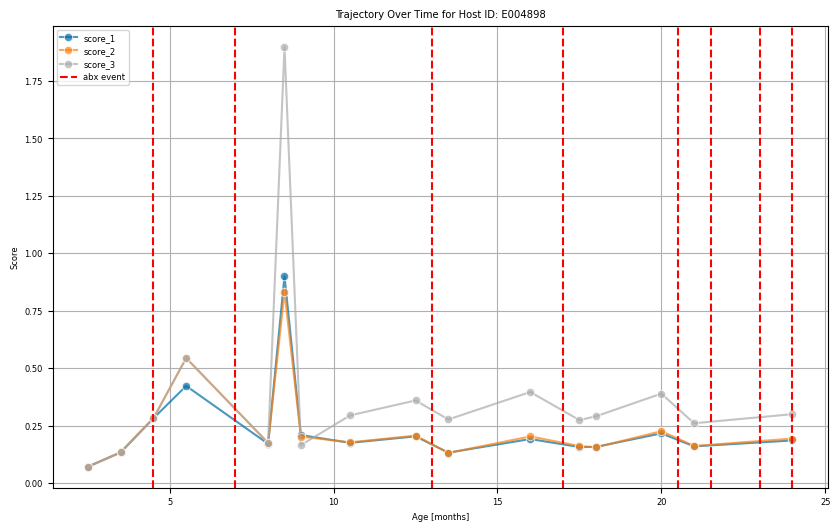

In [30]:
plot_trajectory(
    abx_scores_flat,
    abx_events,
    "E004898",
    ["score_1", "score_2", "score_3"],
    path_to_output=evaluation_path,
    flag="all_scores",
)

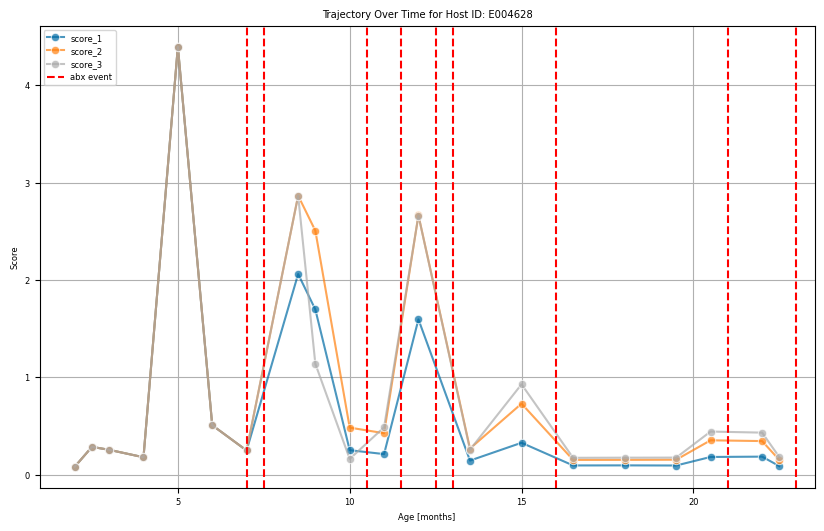

In [31]:
plot_trajectory(
    abx_scores_flat,
    abx_events,
    "E004628",
    ["score_1", "score_2", "score_3"],
    path_to_output=evaluation_path,
    flag="all_scores",
)

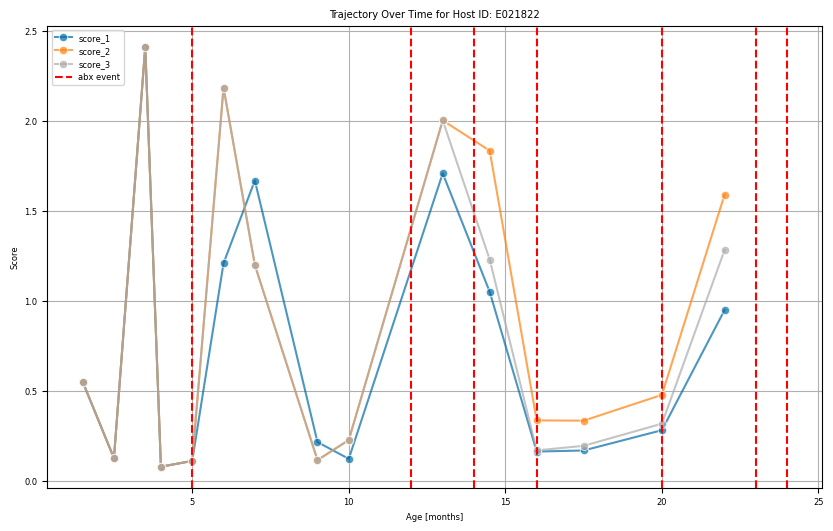

In [32]:
plot_trajectory(
    abx_scores_flat,
    abx_events,
    "E021822",
    ["score_1", "score_2", "score_3"],
    path_to_output=evaluation_path,
    flag="all_scores",
)

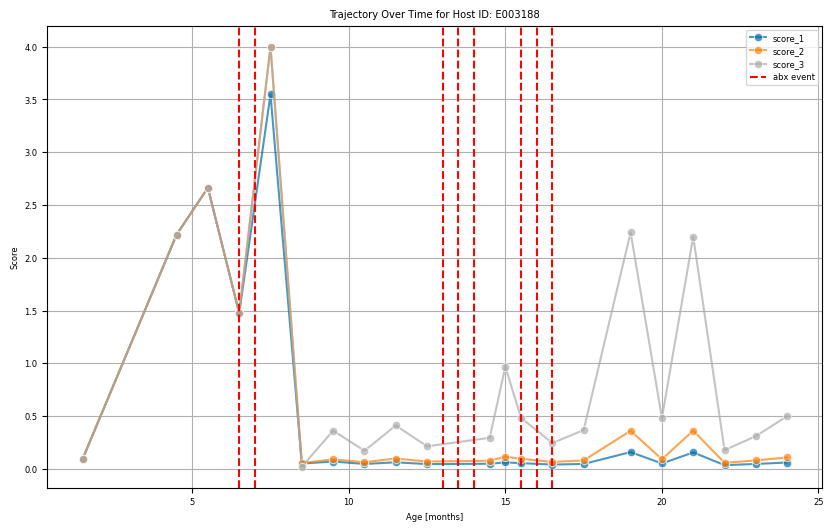

In [33]:
plot_trajectory(
    abx_scores_flat,
    abx_events,
    "E003188",
    ["score_1", "score_2", "score_3"],
    path_to_output=evaluation_path,
    flag="all_scores",
)

### noabx

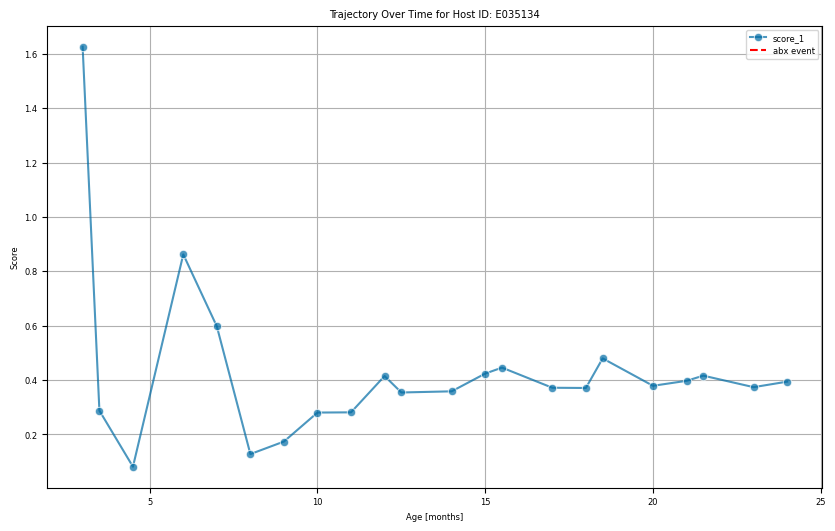

In [34]:
plot_trajectory(
    noabx_train,
    None,
    "E035134",
    ["score_1"],
    path_to_output=evaluation_path,
    flag="noabx_score1",
)

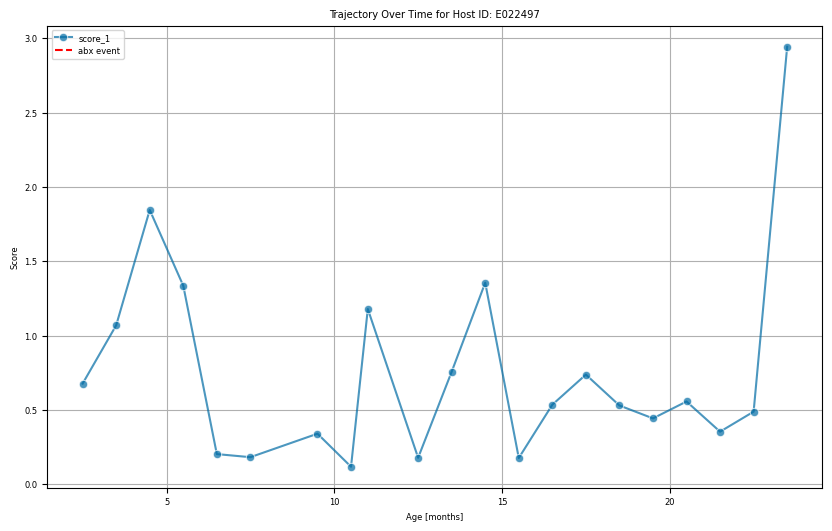

In [35]:
plot_trajectory(
    noabx_train,
    None,
    "E022497",
    ["score_1"],
    path_to_output=evaluation_path,
    flag="noabx_score1",
)